# Network Visualization and Understanding


In this project I illustrated the use of *image gradients* for generating new images.

When training a model, it is defined a loss function which measures current unhappiness with the model's performance; then it uses backpropagation to compute the gradient of the loss with respect to the model parameters, and perform gradient descent on the model parameters to minimize the loss.

Here I have done something slightly different. I started from a convolutional neural network model which has been pretrained to perform image classification on the ImageNet dataset. I used this model to define a loss function which quantifies my current unhappiness with my image, then use backpropagation to compute the gradient of this loss with respect to the pixels of the image. I then kept the model fixed, and performed gradient descent *on the image* to synthesize a new image which minimizes the loss.

In this project I illustrated three techniques for image generation:

1. **Saliency Maps**: Saliency maps are a quick way to tell which part of the image influenced the classification decision made by the network.
2. **Adversarial Attack**: I can perturb an input image so that it appears the same to humans, but will be misclassified by the pretrained network.
3. **Class Visualization**: I can synthesize an image to maximize the classification score of a particular class; this can give some sense of what the network is looking for when it classifies images of that class.


In [ ]:
import os
import torch
import torchvision
import torchvision.transforms as T
import random
import numpy as np
from scipy.ndimage.filters import gaussian_filter1d
import matplotlib.pyplot as plt
SQUEEZENET_MEAN = torch.tensor([0.485, 0.456, 0.406], dtype=torch.float)
SQUEEZENET_STD = torch.tensor([0.229, 0.224, 0.225], dtype=torch.float)
from PIL import Image

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

if torch.cuda.is_available():
  device = 'cuda:0'
else:
  device = 'cpu'
print('Use', device)

Use cuda:0


### Helper Functions

My pretrained model was trained on images that had been preprocessed by subtracting the per-color mean and dividing by the per-color standard deviation. I define a few helper functions for performing and undoing this preprocessing.

In [ ]:
def preprocess(img, size=224):
  transform = T.Compose([
    T.Resize(size),
    T.ToTensor(),
    T.Normalize(mean=SQUEEZENET_MEAN.tolist(),
          std=SQUEEZENET_STD.tolist()),
    T.Lambda(lambda x: x[None]),
  ])
  return transform(img)

def deprocess(img, should_rescale=True):
  transform = T.Compose([
    T.Lambda(lambda x: x[0]),
    T.Normalize(mean=[0, 0, 0], std=(1.0 / SQUEEZENET_STD).tolist()),
    T.Normalize(mean=(-SQUEEZENET_MEAN).tolist(), std=[1, 1, 1]),
    T.Lambda(rescale) if should_rescale else T.Lambda(lambda x: x),
    T.ToPILImage(),
  ])
  return transform(img)

def rescale(x):
  low, high = x.min(), x.max()
  x_rescaled = (x - low) / (high - low)
  return x_rescaled
  
def blur_image(X, sigma=1):
  X_np = X.cpu().clone().numpy()
  X_np = gaussian_filter1d(X_np, sigma, axis=2)
  X_np = gaussian_filter1d(X_np, sigma, axis=3)
  X.copy_(torch.Tensor(X_np).type_as(X))
  return X

# Pretrained Model

For all image generation experiments, I started with a convolutional neural network which was pretrained to perform image classification on ImageNet. I could use any model here, but for the purposes of this project I used SqueezeNet [1], which achieves accuracies comparable to AlexNet but with a significantly reduced parameter count and computational complexity.

Using SqueezeNet rather than AlexNet or VGG or ResNet means that I can easily perform all image generation experiments without heavy computation.

[1] Iandola et al, "SqueezeNet: AlexNet-level accuracy with 50x fewer parameters and < 0.5MB model size", arXiv 2016

In [ ]:
print('Download and load the pretrained SqueezeNet model.')
model = torchvision.models.squeezenet1_1(pretrained=True).to(device)

# I don't want to train the model, so tell PyTorch not to compute gradients
# with respect to model parameters.
for param in model.parameters():
  param.requires_grad = False

Download and load the pretrained SqueezeNet model.


Downloading: "https://download.pytorch.org/models/squeezenet1_1-f364aa15.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_1-f364aa15.pth


## Loading some ImageNet images
I have used a few example images from the validation set of the ImageNet ILSVRC 2012 Classification dataset.

Since they come from the validation set, my pretrained model did not see these images during training.

In [ ]:
# download imagenet_val
if os.path.isfile('imagenet_val_25.npz'):
  print('some ImageNet images exist')
else:
  print('download some ImageNet images')
  !wget http://web.eecs.umich.edu/~justincj/teaching/eecs498/imagenet_val_25.npz

download some ImageNet images
--2020-12-17 21:34:11--  http://web.eecs.umich.edu/~justincj/teaching/eecs498/imagenet_val_25.npz
Resolving web.eecs.umich.edu (web.eecs.umich.edu)... 141.212.113.214
Connecting to web.eecs.umich.edu (web.eecs.umich.edu)|141.212.113.214|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3940548 (3.8M)
Saving to: ‘imagenet_val_25.npz’

imagenet_val_25.npz 100%[===================>]   3.76M  12.5MB/s    in 0.3s    

2020-12-17 21:34:11 (12.5 MB/s) - ‘imagenet_val_25.npz’ saved [3940548/3940548]



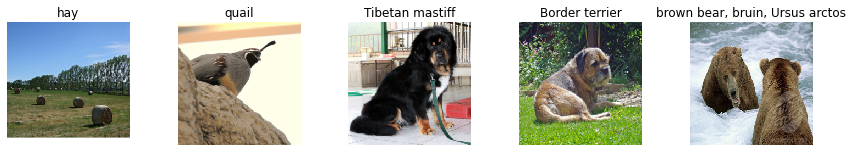

In [ ]:
def load_imagenet_val(num=None):
  """Load a handful of validation images from ImageNet.
  Inputs:
  - num: Number of images to load (max of 25)
  Returns:
  - X: numpy array with shape [num, 224, 224, 3]
  - y: numpy array of integer image labels, shape [num]
  - class_names: dict mapping integer label to class name
  """
  imagenet_fn = 'imagenet_val_25.npz'
  if not os.path.isfile(imagenet_fn):
    print('file %s not found' % imagenet_fn)
    print('Run the following:')
    print('cd cs231n/datasets')
    print('bash get_imagenet_val.sh')
    assert False, 'Need to download imagenet_val_25.npz'
  f = np.load(imagenet_fn, allow_pickle=True)
  X = f['X']
  y = f['y']
  class_names = f['label_map'].item()
  if num is not None:
    X = X[:num]
    y = y[:num]
  return X, y, class_names

X, y, class_names = load_imagenet_val(num=5)

plt.figure(figsize=(12, 6))
for i in range(5):
  plt.subplot(1, 5, i + 1)
  plt.imshow(X[i])
  plt.title(class_names[y[i]])
  plt.axis('off')
plt.gcf().tight_layout()

# Saliency Maps
Using this pretrained model, I compute class saliency maps as described in Section 3.1 of [2].

A **saliency map** tells the degree to which each pixel in the image affects the classification score for that image. To compute it, I compute the gradient of the unnormalized score corresponding to the correct class (which is a scalar) with respect to the pixels of the image. If the image has shape `(3, H, W)` then this gradient will also have shape `(3, H, W)`; for each pixel in the image, this gradient tells me the amount by which the classification score will change if the pixel changes by a small amount. To compute the saliency map, I take the absolute value of this gradient, then take the maximum value over the 3 input channels; the final saliency map thus has shape `(H, W)` and all entries are nonnegative.

[2] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising
Image Classification Models and Saliency Maps", ICLR Workshop 2014.

In [ ]:
def compute_saliency_maps(X, y, model):
  """
  Compute a class saliency map using the model for images X and labels y.
  Input:
  - X: Input images; Tensor of shape (N, 3, H, W)
  - y: Labels for X; LongTensor of shape (N,)
  - model: A pretrained CNN that will be used to compute the saliency map.
  Returns:
  - saliency: A Tensor of shape (N, H, W) giving the saliency maps for the input
  images.
  """
  # Make sure the model is in "test" mode
  model.eval()
  
  # Make input tensor require gradient
  X.requires_grad_()
  scores = model(X)
  correct_scores = torch.gather(scores, 1, y.view(-1, 1)) # gather only correct class
  loss = torch.sum(correct_scores)

  loss.backward()
  saliency = X.grad.data
  saliency = torch.abs(saliency)
  saliency, _ = torch.max(saliency, dim=1)
  return saliency

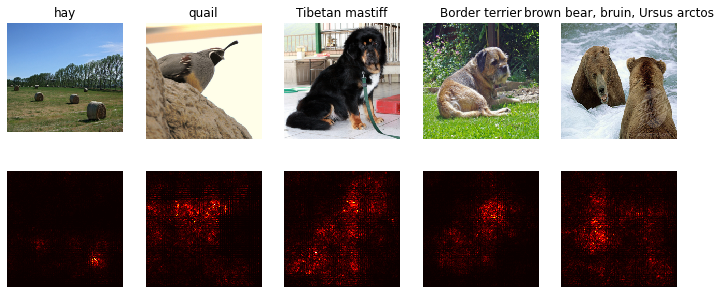

In [ ]:
def show_saliency_maps(X, y):
  # Convert X and y from numpy arrays to Torch Tensors
  X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0).to(device)
  y_tensor = torch.tensor(y, device=device)

  # Compute saliency maps for images in X
  saliency = compute_saliency_maps(X_tensor, y_tensor, model)

  # Convert the saliency map from Torch Tensor to numpy array and show images
  # and saliency maps together.
  saliency = saliency.to('cpu').numpy()
  N = X.shape[0]
  for i in range(N):
    plt.subplot(2, N, i + 1)
    plt.imshow(X[i])
    plt.axis('off')
    plt.title(class_names[y[i]])
    plt.subplot(2, N, N + i + 1)
    plt.imshow(saliency[i], cmap=plt.cm.hot)
    plt.axis('off')
    plt.gcf().set_size_inches(12, 5)
  plt.show()

show_saliency_maps(X, y)

# Adversarial Attack
I can also use image gradients to generate "adversarial attacks".
Given an image and a target class, I can perform gradient **ascent** over the image to maximize the target class, stopping when the network classifies the image as the target class.

[3] Szegedy et al, "Intriguing properties of neural networks", ICLR 2014

In [ ]:
def make_adversarial_attack(X, target_y, model):
  """
  Generate an adversarial attack that is close to X, but that the model classifies
  as target_y.
  Inputs:
  - X: Input image; Tensor of shape (1, 3, 224, 224)
  - target_y: An integer in the range [0, 1000)
  - model: A pretrained CNN
  Returns:
  - X_adv: An image that is close to X, but that is classifed as target_y
  by the model.
  """
  # Initializeing adversarial attack to the input image, and make it require gradient
  X_adv = X.clone()
  X_adv = X_adv.requires_grad_()
  
  learning_rate = 1
  iteration = 1
  while True:
    scores = model(X_adv) # N * num_class
    idx = torch.argmax(scores, dim=1)
    if idx == target_y:
      break
    scores[:, target_y].backward()
    grad = X_adv.grad.data
    dX_adv = grad * learning_rate / torch.norm(grad, 2)
    X_adv.data += dX_adv.data # to avoid inplace
    X_adv.grad.data.zero_()
    
    print('Iteration %d: target score %.3f, max score %.3f'%(iteration, scores[:, target_y], scores[:, idx]))
    iteration += 1
    
  return X_adv

In [ ]:
idx = 0
target_y = 6

X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0).to(device)
X_adv = make_adversarial_attack(X_tensor[idx:idx+1], target_y, model)

scores = model(X_adv)
assert target_y == scores.data.max(1)[1][0].item(), 'The model is not fooled!'

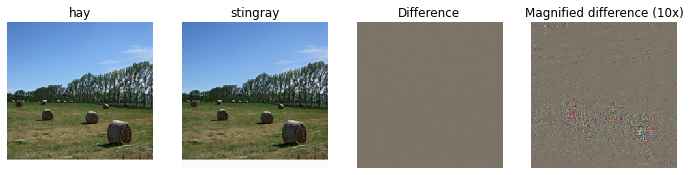

In [ ]:
X_adv = X_adv.to('cpu')
X_adv_np = deprocess(X_adv.clone())
X_adv_np = np.asarray(X_adv_np).astype(np.uint8)

plt.subplot(1, 4, 1)
plt.imshow(X[idx])
plt.title(class_names[y[idx]])
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(X_adv_np)
plt.title(class_names[target_y])
plt.axis('off')

plt.subplot(1, 4, 3)
X_pre = preprocess(Image.fromarray(X[idx]))
diff = np.asarray(deprocess(X_adv - X_pre, should_rescale=False))
plt.imshow(diff)
plt.title('Difference')
plt.axis('off')

plt.subplot(1, 4, 4)
diff = np.asarray(deprocess(10 * (X_adv - X_pre), should_rescale=False))
plt.imshow(diff)
plt.title('Magnified difference (10x)')
plt.axis('off')

plt.gcf().set_size_inches(12, 5)
plt.show()

# Class visualization
By starting with a random noise image and performing gradient ascent on a target class, I can generate an image that the network will recognize as the target class. This idea was first presented in [2]; [3] extended this idea by suggesting several regularization techniques that can improve the quality of the generated image.

Concretely, let $I$ be an image and let $y$ be a target class. Let $s_y(I)$ be the score that a convolutional network assigns to the image $I$ for class $y$; these are raw unnormalized scores, not class probabilities. I wish to generate an image $I^*$ that achieves a high score for the class $y$ by solving the problem

$$
I^* = \arg\max_I (s_y(I) - R(I))
$$

where $R$ is a (possibly implicit) regularizer (the sign of $R(I)$ in the argmax: I need to minimize this regularization term). I solve this optimization problem using gradient ascent, computing gradients with respect to the generated image. I will use (explicit) L2 regularization of the form

$$
R(I) = \lambda \|I\|_2^2
$$

**and** implicit regularization as suggested by [3] by periodically blurring the generated image. I can solve this problem using gradient ascent on the generated image.

[2] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising
Image Classification Models and Saliency Maps", ICLR Workshop 2014.

[3] Yosinski et al, "Understanding Neural Networks Through Deep Visualization", ICML 2015 Deep Learning Workshop

In [ ]:
def jitter(X, ox, oy):
  """
  Function to randomly jitter an image.
  Inputs
  - X: PyTorch Tensor of shape (N, C, H, W)
  - ox, oy: Integers giving number of pixels to jitter along W and H axes 
  Returns: A new PyTorch Tensor of shape (N, C, H, W)
  """
  if ox != 0:
    left = X[:, :, :, :-ox]
    right = X[:, :, :, -ox:]
    X = torch.cat([right, left], dim=3)
  if oy != 0:
    top = X[:, :, :-oy]
    bottom = X[:, :, -oy:]
    X = torch.cat([bottom, top], dim=2)
  return X

In [ ]:
def create_class_visualization(target_y, model, device, **kwargs):
  """
  Generates an image to maximize the score of target_y under a pretrained model.
  Inputs:
  - target_y: Integer in the range [0, 1000) giving the index of the class
  - model: A pretrained CNN that will be used to generate the image
  - dtype: Torch datatype to use for computations
  Keyword arguments:
  - l2_reg: Strength of L2 regularization on the image
  - learning_rate: How big of a step to take
  - num_iterations: How many iterations to use
  - blur_every: How often to blur the image as an implicit regularizer
  - max_jitter: How much to gjitter the image as an implicit regularizer
  - show_every: How often to show the intermediate result
  """
  model.to(device)
  l2_reg = kwargs.pop('l2_reg', 1e-3)
  learning_rate = kwargs.pop('learning_rate', 25)
  num_iterations = kwargs.pop('num_iterations', 1000)
  blur_every = kwargs.pop('blur_every', 10)
  max_jitter = kwargs.pop('max_jitter', 16)
  show_every = kwargs.pop('show_every', 25)

  # Randomly initialize the image as a PyTorch Tensor, and make it requires gradient.
  img = torch.randn(1, 3, 224, 224).mul_(1.0).to(device).requires_grad_()

  for t in range(num_iterations):
    # Randomly jitter the image a bit; this gives slightly nicer results
    ox, oy = random.randint(0, max_jitter), random.randint(0, max_jitter)
    img.data.copy_(jitter(img.data, ox, oy))
    scores = model(img)
    # (s_y(I) - R(I))
    score = scores[:,target_y] - (l2_reg * (torch.norm(img)**2))
    score.backward()
    img.data += (learning_rate*img.grad.data/torch.norm(img.grad.data)) # not right
    img.grad.data.zero_()
    
    # Undo the random jitter
    img.data.copy_(jitter(img.data, -ox, -oy))

    # As regularizer, clamp and periodically blur the image
    for c in range(3):
      lo = float(-SQUEEZENET_MEAN[c] / SQUEEZENET_STD[c])
      hi = float((1.0 - SQUEEZENET_MEAN[c]) / SQUEEZENET_STD[c])
      img.data[:, c].clamp_(min=lo, max=hi)
    if t % blur_every == 0:
      blur_image(img.data, sigma=0.5)

    # Periodically show the image
    if t == 0 or (t + 1) % show_every == 0 or t == num_iterations - 1:
      plt.imshow(deprocess(img.data.clone().cpu()))
      class_name = class_names[target_y]
      plt.title('%s\nIteration %d / %d' % (class_name, t + 1, num_iterations))
      plt.gcf().set_size_inches(4, 4)
      plt.axis('off')
      plt.show()

  return deprocess(img.data.cpu())

## Generating an image of a Tarantula:

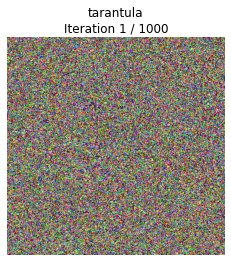

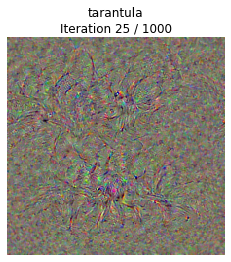

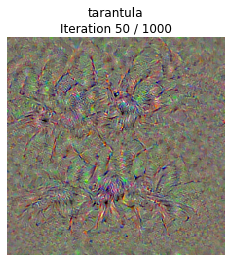

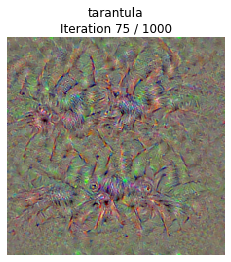

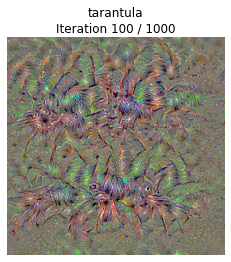

...

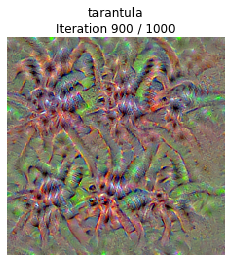

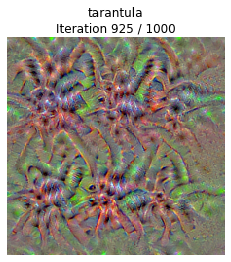

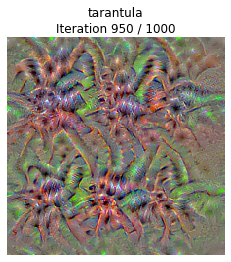

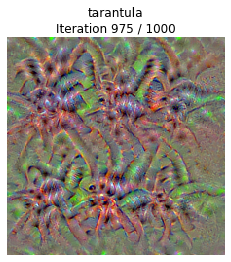

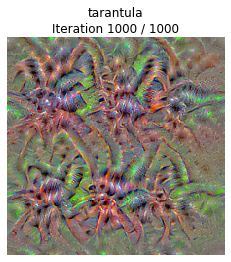

In [ ]:
target_y = 76 # Tarantula
# target_y = 78 # Tick
# target_y = 187 # Yorkshire Terrier
# target_y = 683 # Oboe
# target_y = 366 # Gorilla
# target_y = 604 # Hourglass
out = create_class_visualization(target_y, model, device)

Trying out your class visualization on other classes!

crossword puzzle, crossword


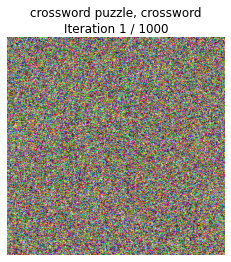

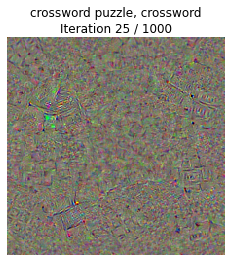

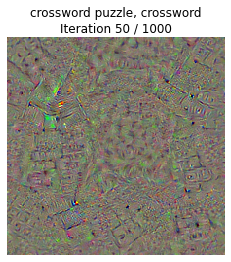

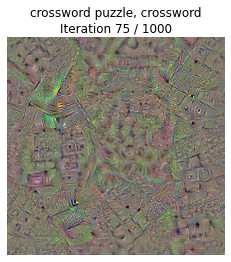

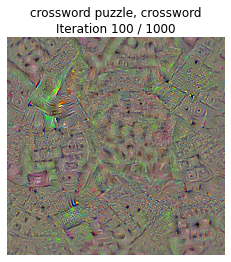

...

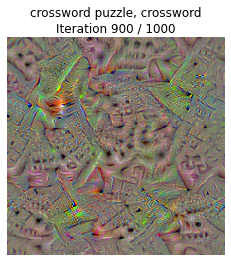

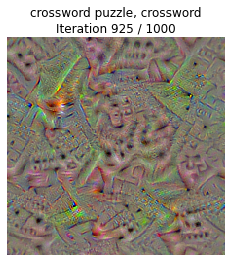

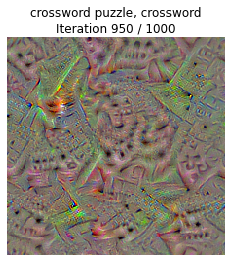

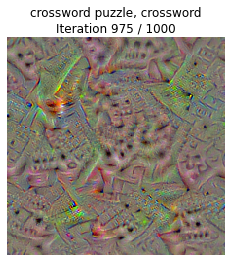

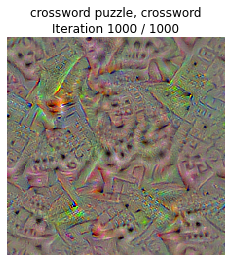

In [ ]:
# target_y = 78 # Tick
# target_y = 187 # Yorkshire Terrier
# target_y = 683 # Oboe
# target_y = 366 # Gorilla
# target_y = 604 # Hourglass
target_y = random.randint(0,999) # [0,999]
print(class_names[target_y])
out = create_class_visualization(target_y, model, device)